<a href="https://colab.research.google.com/github/jun-wei-lin/NCHU/blob/main/Computer-Vision/Week_10/5113056023_hw3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

檔名:(您的學號)_hw3.ipynb

一.載入資料集:https://www.kaggle.com/datasets/lara311/flowers-five-classes (10分)

In [ ]:
import kagglehub
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import models, transforms
import torchvision.transforms as transforms
import torchvision.models as models
from matplotlib import pyplot as plt
from PIL import Image
import requests
import numpy as np
from sklearn.metrics import accuracy_score
from torch.utils.data import DataLoader, Dataset
from torch.utils.data import Dataset, DataLoader, random_split
from tqdm import tqdm

# Download latest version
path = kagglehub.dataset_download("lara311/flowers-five-classes")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/lara311/flowers-five-classes/versions/1


二.視覺化每個類別的第一張圖和各自的真實標籤(10分)

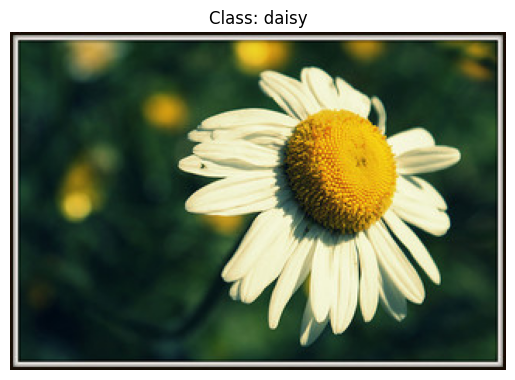

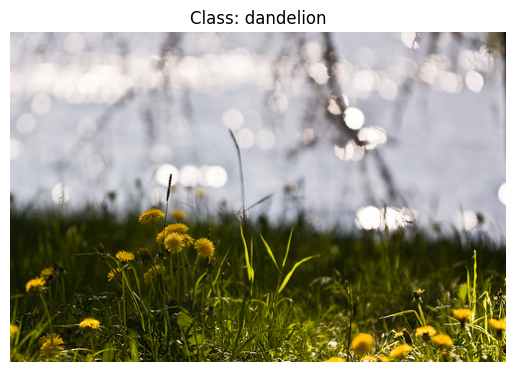

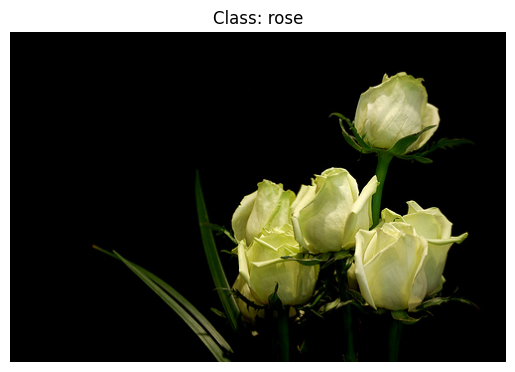

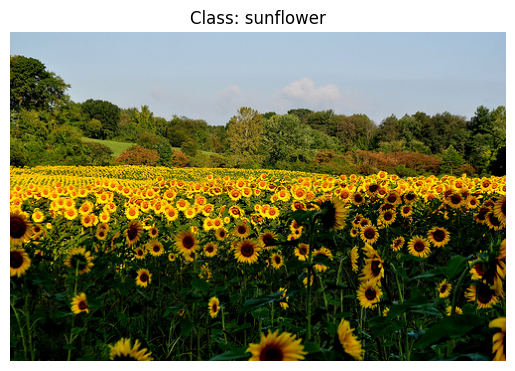

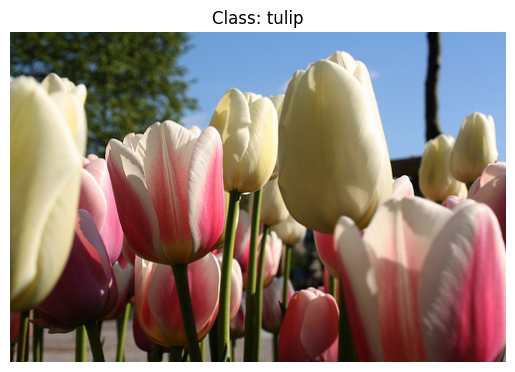

視覺化完成。


In [ ]:
# 設定資料夾路徑
data_dir = '/root/.cache/kagglehub/datasets/lara311/flowers-five-classes/versions/1/train'

# 取得所有類別的名稱
classes = sorted(os.listdir(data_dir))

# 視覺化每個類別的第一張圖和真實標籤
for class_name in classes:
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
        # 確認目錄內有圖片
        images = [img for img in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, img))]
        if images:
            first_image = images[0]  # 取得第一張圖片
            img_path = os.path.join(class_path, first_image)

            # 打開圖片並顯示
            img = Image.open(img_path)
            plt.figure()
            plt.imshow(img)
            plt.title(f'Class: {class_name}')
            plt.axis('off')  # 隱藏座標軸
            plt.show()

print("視覺化完成。")


*三*.使用resnet18模型推論每種類別的前五張圖片,顯示出圖片、真實標籤和預測標籤(10分)

---

分)

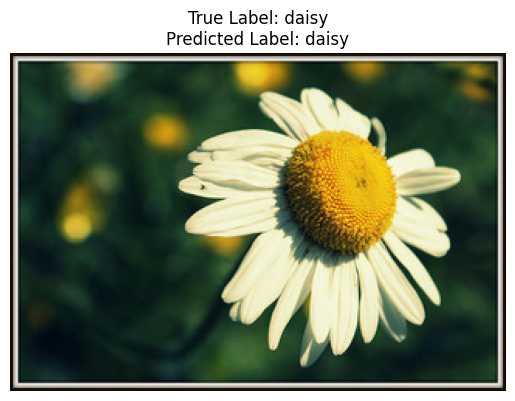

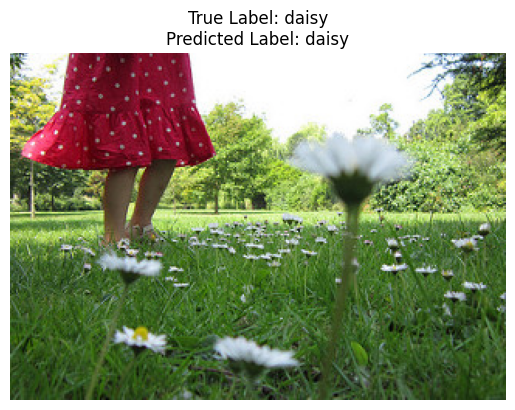

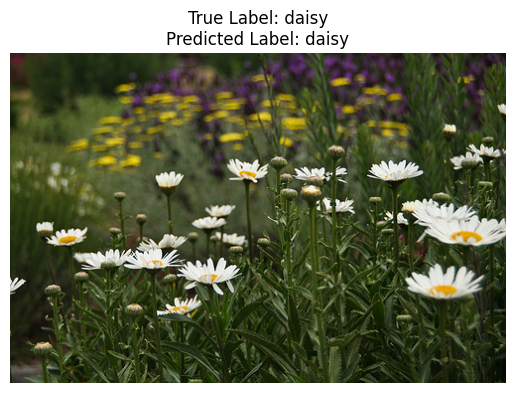

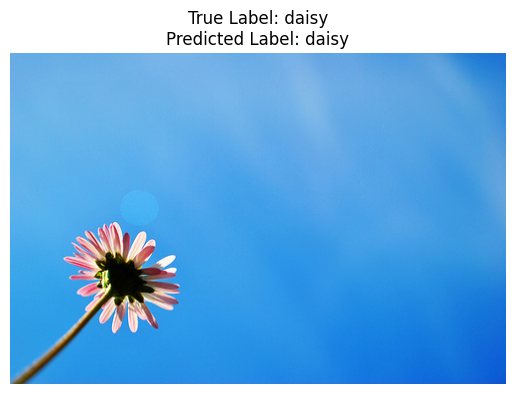

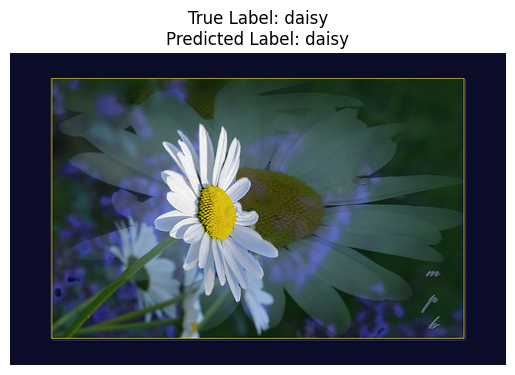

...

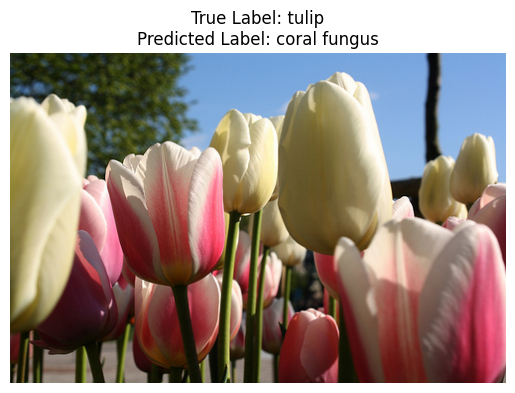

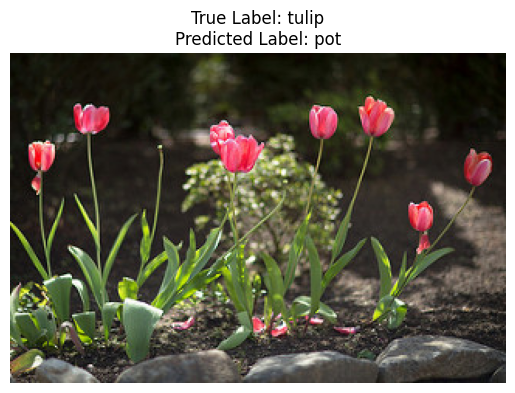

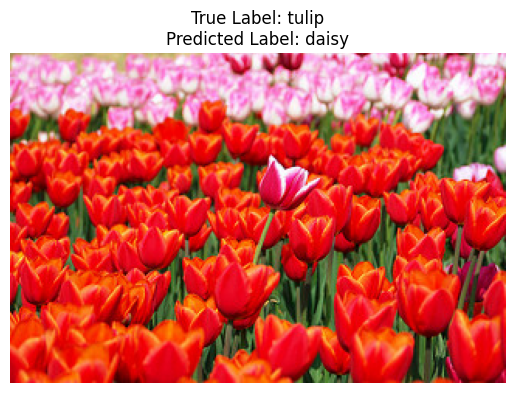

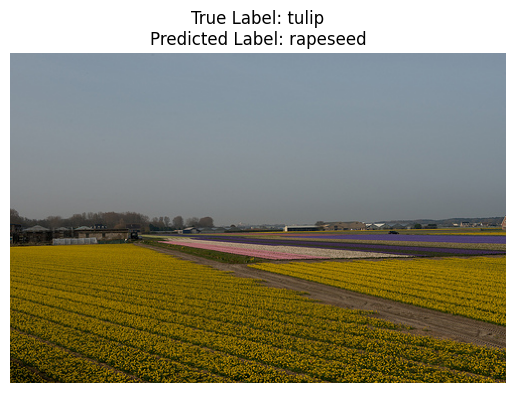

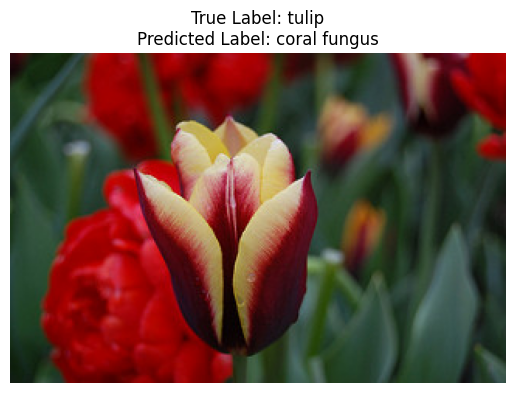

推論與顯示完成。


In [ ]:
# 載入 ResNet18 模型
model = models.resnet18(pretrained=True)
model.eval()  # 設定模型為評估模式

# 定義圖像轉換
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
# Install necessary package
!pip install requests

# 獲取完整的 ImageNet 類別列表

url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
response = requests.get(url)
imagenet_classes = [line.strip() for line in response.text.splitlines()]


# 確認標籤數量與模型輸出一致
if len(imagenet_classes) != 1000:  # 改為檢查是否為 1000 個類別
    raise ValueError(f"ImageNet 類別列表不完整，應有 1000 個類別，但實際只有 {len(imagenet_classes)} 個。")

# 取得所有類別的名稱
classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])

# 推論每個類別的前五張圖片
for class_name in classes:
    class_path = os.path.join(data_dir, class_name)
    images = [img for img in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, img))]
    images = images[:5]  # 只選前五張圖片

    for img_name in images:
        img_path = os.path.join(class_path, img_name)
        img = Image.open(img_path).convert("RGB")

        # 圖像預處理
        input_tensor = transform(img).unsqueeze(0)

        # 推論
        with torch.no_grad():
            outputs = model(input_tensor)
            _, predicted_idx = outputs.max(1)
            if predicted_idx.item() < len(imagenet_classes):
                predicted_label = imagenet_classes[predicted_idx.item()]
            else:
                predicted_label = "Unknown"

        # 顯示圖片、真實標籤和預測標籤
        plt.figure()
        plt.imshow(img)
        plt.title(f'True Label: {class_name}\nPredicted Label: {predicted_label}')
        plt.axis('off')  # 隱藏座標軸
        plt.show()

print("推論與顯示完成。")

四.使用resnet18模型,修改輸出層為5個類別並推論資料集的所有圖片,計算並顯示出Accuracy和Rank 2 Accuracy(10分)

In [ ]:
# 自定義 Dataset 類別來加載圖片
class FlowerDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])
        self.image_paths = []
        self.labels = []

        # 生成圖片路徑列表和標籤
        for class_idx, class_name in enumerate(self.classes):
            class_path = os.path.join(data_dir, class_name)
            images = [img for img in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, img))]
            for img_name in images:
                self.image_paths.append(os.path.join(class_path, img_name))
                self.labels.append(class_idx)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, label

# 載入 ResNet18 模型並修改輸出層為 5 類別
model = models.resnet18(pretrained=True)
model.fc = torch.nn.Linear(model.fc.in_features, 5)  # 修改最後一層為5類別
model.eval()  # 設定模型為評估模式

# 定義圖像轉換
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 設定資料夾路徑
data_dir = '/root/.cache/kagglehub/datasets/lara311/flowers-five-classes/versions/1/train'

# 創建 Dataset 和 DataLoader
dataset = FlowerDataset(data_dir=data_dir, transform=transform)
batch_size = 32  # 根據硬體設置適當的批次大小
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# 儲存預測結果和真實標籤
all_predictions = []
all_labels = []

# 使用 torch.no_grad() 來避免梯度計算
with torch.no_grad():
    for inputs, labels in dataloader:
        # 推論
        outputs = model(inputs)
        _, predicted_idx = outputs.max(1)

        # 儲存預測結果和真實標籤
        all_labels.extend(labels.numpy())
        all_predictions.extend(predicted_idx.numpy())

# 計算 Accuracy 和 Rank-2 Accuracy
all_predictions = np.array(all_predictions)
all_labels = np.array(all_labels)

# Accuracy
accuracy = accuracy_score(all_labels, all_predictions)
print(f"Accuracy: {accuracy:.4f}")

# Rank-2 Accuracy
rank_2_accuracy = np.mean([true_label in np.argsort(preds)[::-1][:2] for preds, true_label in zip(all_predictions, all_labels)])
print(f"Rank-2 Accuracy: {rank_2_accuracy:.4f}")


Accuracy: 0.1773
Rank-2 Accuracy: 0.1824


五.資料預處理且將資料集分割成80% 訓練集, 10% 驗證集, 10% 測試集(10分)

In [ ]:

# 自定義 Dataset 類別來加載圖片
class FlowerDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])
        self.image_paths = []
        self.labels = []

        # 生成圖片路徑列表和標籤
        for class_idx, class_name in enumerate(self.classes):
            class_path = os.path.join(data_dir, class_name)
            images = [img for img in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, img))]
            for img_name in images:
                self.image_paths.append(os.path.join(class_path, img_name))
                self.labels.append(class_idx)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, label

# 定義圖像轉換（預處理）
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # 調整圖片大小為224x224
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # ImageNet 標準化
])

# 設定資料夾路徑
data_dir = '/root/.cache/kagglehub/datasets/lara311/flowers-five-classes/versions/1/train'

# 創建資料集實例
dataset = FlowerDataset(data_dir=data_dir, transform=transform)

# 計算資料集的大小
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)  # 80% 訓練集
val_size = int(0.1 * dataset_size)    # 10% 驗證集
test_size = dataset_size - train_size - val_size  # 剩下的是測試集

# 將資料集分割為訓練集、驗證集和測試集
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# 使用 DataLoader 批次加載資料
batch_size = 32  # 可根據硬體設置適當的批次大小

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

print(f"訓練集大小: {len(train_loader.dataset)}")
print(f"驗證集大小: {len(val_loader.dataset)}")
print(f"測試集大小: {len(test_loader.dataset)}")

訓練集大小: 2196
驗證集大小: 274
測試集大小: 276


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


六:微調resnet18模型,修改輸出層為5個類別並設置learning rate scheduler和Checkpoint -> saving the best model,請顯示出訓練過程,包含每個epoh的Train Accuracy和validation accuracy,以及Checkpoint的狀況(25分)

In [ ]:
# 1. 定義數據處理和資料集類別
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

class FlowerDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])
        self.image_paths = []
        self.labels = []

        for class_idx, class_name in enumerate(self.classes):
            class_path = os.path.join(data_dir, class_name)
            images = [img for img in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, img))]
            for img_name in images:
                self.image_paths.append(os.path.join(class_path, img_name))
                self.labels.append(class_idx)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, label

# 設定資料集路徑
data_dir = '/root/.cache/kagglehub/datasets/lara311/flowers-five-classes/versions/1/train'

# 創建資料集實例
dataset = FlowerDataset(data_dir=data_dir, transform=transform)

# 計算資料集大小並分割
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)
val_size = int(0.1 * dataset_size)
test_size = dataset_size - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# 使用 DataLoader 批次加載資料
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# 2. 載入預訓練的 ResNet18 並修改輸出層
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 5)  # 修改為5個類別
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# 3. 定義損失函數、優化器、學習率調度器
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# 設置學習率調度器
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)  # 每5個epoch學習率縮小為原來的 0.1

# 4. 設置最佳模型檢查點
checkpoint_dir = 'checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
best_val_acc = 0.0

# 5. 訓練和驗證過程
num_epochs = 10
for epoch in range(num_epochs):
    model.train()  # 訓練模式
    running_loss = 0.0
    correct_train = 0
    total_train = 0

    # 訓練階段
    for inputs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Train"):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # 計算訓練準確度
        _, predicted = outputs.max(1)
        correct_train += (predicted == labels).sum().item()
        total_train += labels.size(0)
        running_loss += loss.item()

    train_acc = correct_train / total_train
    avg_train_loss = running_loss / len(train_loader)

    # 驗證階段
    model.eval()  # 評估模式
    correct_val = 0
    total_val = 0
    with torch.no_grad():
        running_val_loss = 0.0
        for inputs, labels in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validate"):
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()

            _, predicted = outputs.max(1)
            correct_val += (predicted == labels).sum().item()
            total_val += labels.size(0)

    val_acc = correct_val / total_val
    avg_val_loss = running_val_loss / len(val_loader)

    # 顯示訓練和驗證結果
    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"訓練損失: {avg_train_loss:.4f}, 訓練準確度: {train_acc:.4f}")
    print(f"驗證損失: {avg_val_loss:.4f}, 驗證準確度: {val_acc:.4f}")

    # 存儲最佳模型
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        checkpoint_path = os.path.join(checkpoint_dir, f"best_model_epoch{epoch+1}.pth")
        torch.save(model.state_dict(), checkpoint_path)
        print(f"保存最佳模型：{checkpoint_path}")

    # 學習率調度
    scheduler.step()

# 6. 測試模型
def test_model(model, test_loader, device):
    model.eval()  # 設定為評估模式
    correct_test = 0
    total_test = 0
    correct_rank2_test = 0
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)

            # 計算準確度
            _, predicted = outputs.max(1)
            correct_test += (predicted == labels).sum().item()
            total_test += labels.size(0)

            # 計算 Rank-2 準確度
            _, top2 = outputs.topk(2, dim=1, largest=True, sorted=True)
            correct_rank2_test += torch.sum(top2 == labels.unsqueeze(1)).item()

    # 計算最終的準確度和Rank-2準確度
    test_acc = correct_test / total_test
    rank2_test_acc = correct_rank2_test / total_test

    # 返回準確度和Rank-2準確度
    return test_acc, rank2_test_acc

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 1/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  7.16it/s]


Epoch 1/10
訓練損失: 0.4648, 訓練準確度: 0.8370
驗證損失: 0.1716, 驗證準確度: 0.9343
保存最佳模型：checkpoints/best_model_epoch1.pth


Epoch 2/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  6.90it/s]


Epoch 2/10
訓練損失: 0.0964, 訓練準確度: 0.9736
驗證損失: 0.1431, 驗證準確度: 0.9526
保存最佳模型：checkpoints/best_model_epoch2.pth


Epoch 3/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  6.47it/s]


Epoch 3/10
訓練損失: 0.0361, 訓練準確度: 0.9950
驗證損失: 0.1334, 驗證準確度: 0.9416


Epoch 4/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  4.67it/s]


Epoch 4/10
訓練損失: 0.0152, 訓練準確度: 0.9991
驗證損失: 0.1028, 驗證準確度: 0.9562
保存最佳模型：checkpoints/best_model_epoch4.pth


Epoch 5/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  6.40it/s]


Epoch 5/10
訓練損失: 0.0096, 訓練準確度: 0.9991
驗證損失: 0.1289, 驗證準確度: 0.9599
保存最佳模型：checkpoints/best_model_epoch5.pth


Epoch 6/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  7.26it/s]


Epoch 6/10
訓練損失: 0.0076, 訓練準確度: 0.9991
驗證損失: 0.1254, 驗證準確度: 0.9562


Epoch 7/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  7.24it/s]


Epoch 7/10
訓練損失: 0.0072, 訓練準確度: 0.9995
驗證損失: 0.1108, 驗證準確度: 0.9599


Epoch 8/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  6.73it/s]


Epoch 8/10
訓練損失: 0.0044, 訓練準確度: 1.0000
驗證損失: 0.1076, 驗證準確度: 0.9562


Epoch 9/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  4.81it/s]


Epoch 9/10
訓練損失: 0.0051, 訓練準確度: 1.0000
驗證損失: 0.1135, 驗證準確度: 0.9489


Epoch 10/10 - Validate: 100%|██████████| 9/9 [00:01<00:00,  5.35it/s]

Epoch 10/10
訓練損失: 0.0041, 訓練準確度: 1.0000
驗證損失: 0.1063, 驗證準確度: 0.9562


七.顯示出Accuracy和Rank-2 Accuracy(10分)

In [ ]:
# 使用最佳模型進行測試
best_model_path = os.path.join(checkpoint_dir, "best_model_epoch10.pth")  # 假設最佳模型在第 10 個 epoch
model.load_state_dict(torch.load(best_model_path))

# 獲取並顯示最終測試結果
test_acc, rank2_test_acc = test_model(model, test_loader, device)

# 顯示最終的準確度和Rank-2準確度
print(f"\n測試集準確度: {test_acc:.4f}")
print(f"Rank-2 測試準確度: {rank2_test_acc:.4f}")


<ipython-input-32-4ac6d52ec890>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_model_path))



測試集準確度: 0.9928
Rank-2 測試準確度: 1.0000


八.使用微調完的resnet18模型推論測試集每種類別的前五張圖片,顯示出圖片、真實標籤和預測標籤(15分)

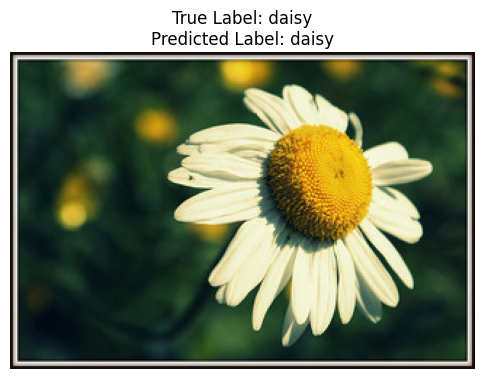

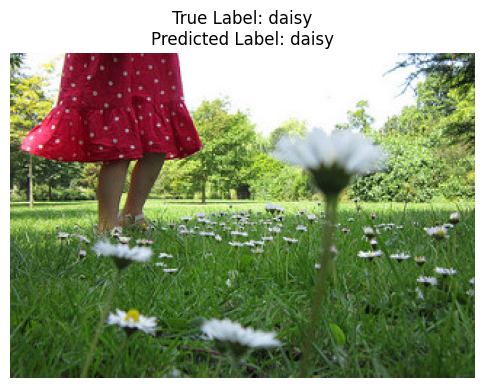

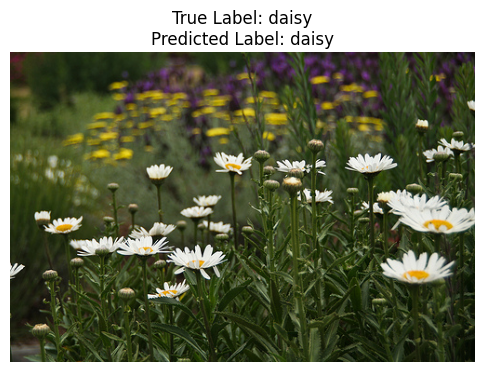

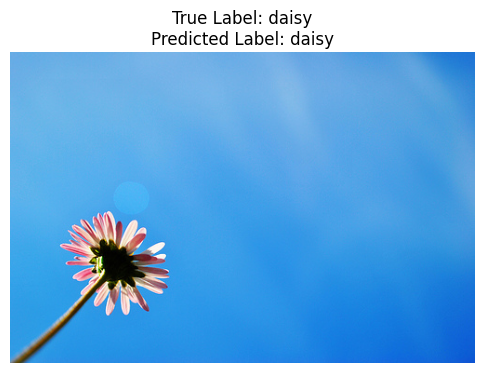

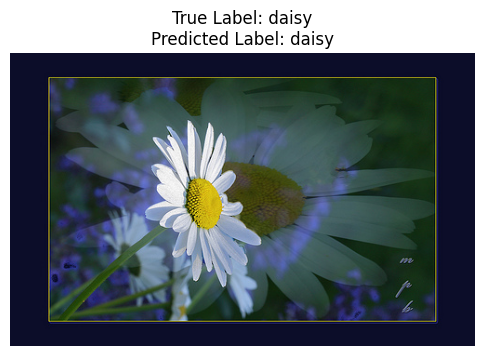

...

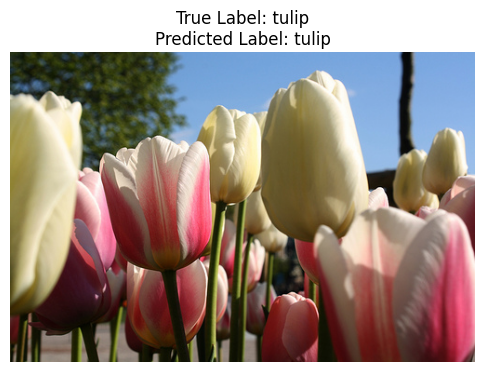

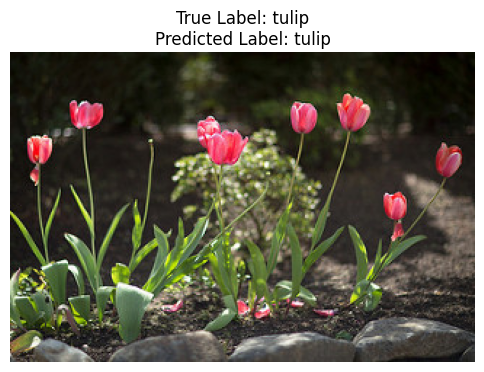

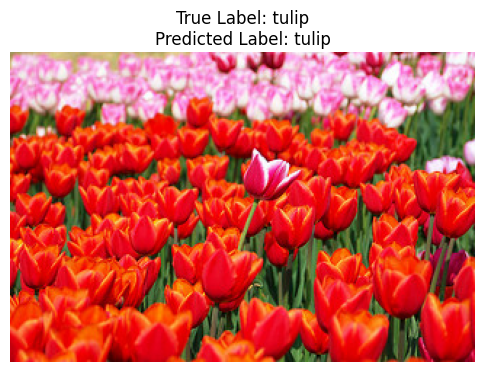

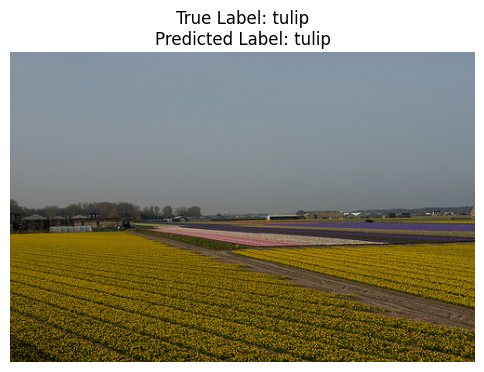

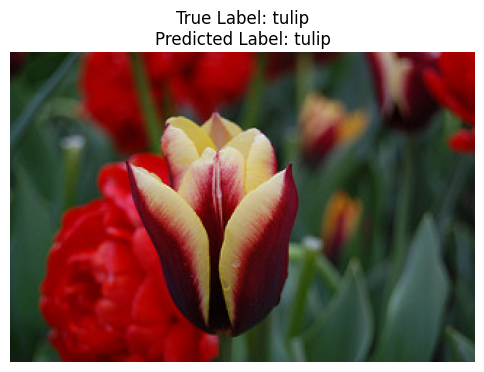

In [ ]:

# 定義圖像預處理
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 獲取類別名稱 (假設資料集資料夾名稱就是類別名稱)
classes = sorted([d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))])

# 使用微調後的 ResNet18 模型進行推論
model.eval()  # 設置為評估模式

# 定義顯示每個類別的前五張圖片及其預測
def display_predictions(model, test_loader, classes, device):
    with torch.no_grad():
        # 遍歷所有類別
        for class_idx, class_name in enumerate(classes):
            # 找出每一類別的前五張圖片
            class_path = os.path.join(data_dir, class_name)
            images = [img for img in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, img))]
            images = images[:5]  # 只取前五張

            for img_name in images:
                img_path = os.path.join(class_path, img_name)
                img = Image.open(img_path).convert("RGB")

                # 圖像預處理
                input_tensor = transform(img).unsqueeze(0).to(device)

                # 推論
                outputs = model(input_tensor)
                _, predicted_idx = outputs.max(1)
                predicted_label = classes[predicted_idx.item()]

                # 顯示圖片、真實標籤和預測標籤
                plt.figure(figsize=(6, 6))
                plt.imshow(img)
                plt.title(f'True Label: {class_name}\nPredicted Label: {predicted_label}')
                plt.axis('off')  # 隱藏座標軸
                plt.show()

# 顯示測試集每類別的前五張圖片
display_predictions(model, test_loader, classes, device)